# PA 2: Classification - Decision Tree

## Student Details 

First Student Name and ID: Varun Adit Dhamudaran Sathish 1001944885

Second Student Name and ID: Supreetha Darbha 1002035242

Third Student Name and ID: Subhash Duggirala 1001965810


In [1]:
# special IPython command to prepare the notebook for matplotlib
%matplotlib inline 

#Array processing
import numpy as np
#Data analysis, wrangling and common exploratory operations
import pandas as pd
from pandas import Series, DataFrame
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

from sklearn import decomposition, datasets
from sklearn import tree
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score



#For visualization. Matplotlib for basic viz and seaborn for more stylish figures
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#Load dataset_DT_NB.csv and see first five elements of our dataset
df = pd.read_csv('dataset_DT_NB.csv', sep=';')
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


## Data Preprocessing

In [3]:
# Creating a new column "smoke_or_alco" based on the attributes "smoke" and "alco" in order to reduce number of attributes.
def compute_smo_alco(df):
    if ((df['smoke']==1) or (df['alco']==1)) :
        return 1
    else :
        return 0


df['smoke_or_alco'] = df.apply(compute_smo_alco, axis=1)
df.tail(5)

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,smoke_or_alco
69995,99993,19240,2,168,76.0,120,80,1,1,1,0,1,0,1
69996,99995,22601,1,158,126.0,140,90,2,2,0,0,1,1,0
69997,99996,19066,2,183,105.0,180,90,3,1,0,1,0,1,1
69998,99998,22431,1,163,72.0,135,80,1,2,0,0,0,1,0
69999,99999,20540,1,170,72.0,120,80,2,1,0,0,1,0,0


In [4]:
#Convert df['age'] attribute from days to years and store it in df['age_y']
df['age_y']= round(df['age']/365)
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,smoke_or_alco,age_y
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0,0,50.0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1,0,55.0
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1,0,52.0
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1,0,48.0
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0,0,48.0


In [5]:
#Checking if there are any missing values that could affect our predictions
df.isnull().sum()

id               0
age              0
gender           0
height           0
weight           0
ap_hi            0
ap_lo            0
cholesterol      0
gluc             0
smoke            0
alco             0
active           0
cardio           0
smoke_or_alco    0
age_y            0
dtype: int64

Cleaning any outliers that are present in our dataset 


In [6]:
#Computing precision for the attribute "ap_hi" 
def clean_ap_hi(df):
    if df['ap_hi']<(-50) :
        return (df['ap_hi']*(-1))
    elif df['ap_hi']<3 :
        return (df['ap_hi']*100)
    elif df['ap_hi']<30 :
        return (df['ap_hi']*10)
    elif df['ap_hi']>10000:
        return (df['ap_hi']/100)
    elif df['ap_hi']>700:
        return (df['ap_hi']/10)
    else :
        return df['ap_hi']
df['ap_hi'] = df.apply(clean_ap_hi, axis=1)

In [7]:
#Computing precision for the attribute "ap_low" 
def clean_ap_lo(df):
    if df['ap_lo']<(-50) :
        return (df['ap_lo']*(-1))
    elif df['ap_lo']>5000:
        return (df['ap_lo']/100)
    elif df['ap_lo']>500:
        return (df['ap_lo']/10)
    else :
        return df['ap_lo']
df['ap_lo'] = df.apply(clean_ap_lo, axis=1)

df = df[df['ap_lo']>30]


In [8]:
def clean_height(df) :
    if df['height']<100 & (df['weight']>(df['height']/2)):
        return df['height']+100
    else :
        return df['height']

df['height'] = df.apply(clean_height, axis=1)

In [9]:
#Reducing weight and height into one attribute of bmi(Body Mass Index)
df = df[df['weight']>40]
df['bmi']=df['weight']*((100/df['height'])**2)

In [10]:
#we are pre-processing data and ignoring unwanted 
features = ['age_y',
            'gender',
            'bmi',
            'ap_hi',
            'ap_lo',
            'cholesterol',
            'gluc',
            'smoke_or_alco',
            'active'
           ]

In [11]:
X = df[features]
Y = df['cardio']

In [12]:
#Sorting the values of the attribute "ap_hi"
X.sort_values('ap_hi')

,age_y,gender,bmi,ap_hi,ap_lo,cholesterol,gluc,smoke_or_alco,active
13755,44.0,1,29.615806,60.0,40.0,1,3,0,0
4830,46.0,2,26.897670,70.0,100.0,1,1,0,0
7076,58.0,1,25.721032,70.0,50.0,2,2,1,0
40454,56.0,1,23.051755,70.0,110.0,1,1,0,0
40634,46.0,2,25.990903,70.0,120.0,1,1,1,1
...,...,...,...,...,...,...,...,...,...
26053,62.0,1,37.015532,240.0,130.0,2,1,0,1
67710,54.0,2,26.573129,240.0,140.0,3,1,0,1
69329,54.0,1,29.488704,240.0,130.0,1,1,0,0
56014,60.0,2,37.125517,240.0,110.0,1,1,0,1


In [13]:
X.sort_values('ap_lo')

,age_y,gender,bmi,ap_hi,ap_lo,cholesterol,gluc,smoke_or_alco,active
42446,62.0,2,35.563943,130.0,40.0,1,1,0,1
28401,60.0,2,21.633315,150.0,40.0,1,2,0,1
43137,60.0,1,41.522491,160.0,40.0,3,3,0,1
51151,60.0,1,35.111111,150.0,40.0,2,1,0,1
17552,42.0,1,22.151023,130.0,40.0,1,1,0,1
...,...,...,...,...,...,...,...,...,...
55291,56.0,1,24.092971,130.0,190.0,1,1,0,1
49303,60.0,1,34.889854,170.0,190.0,2,2,1,1
63924,44.0,1,25.654372,130.0,190.0,1,1,0,1
29789,50.0,2,24.005487,140.0,190.0,1,1,1,1


In [14]:
# Print first five records to confirm that correct columns are included. 
Y.head()

0    0
1    1
2    1
3    1
4    0
Name: cardio, dtype: int64

# Split your dataset 75% for training, and 25% for testing the classifier. 

In [15]:
#creating training and test sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, random_state=101, test_size=0.25)

In [16]:
Y_train.value_counts(normalize=True)

1    0.501164
0    0.498836
Name: cardio, dtype: float64

In [17]:
Y_test.value_counts(normalize=True)

0    0.503551
1    0.496449
Name: cardio, dtype: float64

# Decision Tree

## Using gini and entropy to measure the quality of a split.

In [18]:
#Using Gini while training
dt_model_gini = DecisionTreeClassifier(random_state=10)

In [19]:
dt_model_gini.fit(X_train, Y_train)

DecisionTreeClassifier(random_state=10)

In [20]:
#Training set accuracy for gini
print('The score for training set %.3f' % (dt_model_gini.score(X_train, Y_train)*100) +'%')

The score for training set 97.654%


In [21]:
#Testing set accuracy for gini
print('The score for testing set %.3f' % (dt_model_gini.score(X_test, Y_test)*100) +'%')

The score for testing set 65.256%


In [22]:
#Using entropy while training
dt_model_entropy = DecisionTreeClassifier(criterion='entropy', random_state=10)

In [23]:
dt_model_entropy.fit(X_train, Y_train)

DecisionTreeClassifier(criterion='entropy', random_state=10)

In [24]:
#Training set accuracy for entropy
dt_model_entropy.score(X_train, Y_train)
print('The score for training set %.3f' % (dt_model_entropy.score(X_train, Y_train)*100) +'%')

The score for training set 97.654%


In [25]:
#Testing set accuracy for entropy
print('The score for testing set %.3f' % (dt_model_entropy.score(X_test, Y_test)*100) +'%')

The score for testing set 65.004%


A score of 65.239 for Gini based DT and a score of 65.004 for Entropy based DT, is not accurate enough, so we tried to improve those scores.

## Tuning our classifiers for Gini

In [26]:
#First let us find out the ideal conditions for DT(Gini)
train_accuracy_gini = []
validation_accuracy_gini = []
for max_nodes in range (13,50):
    dt_model = DecisionTreeClassifier(max_depth=5, max_leaf_nodes=max_nodes, random_state=10)
    dt_model.fit(X_train, Y_train)
    train_accuracy_gini.append(dt_model.score(X_train, Y_train))
    validation_accuracy_gini.append(dt_model.score(X_test, Y_test))

In [27]:
frame= pd.DataFrame({'max_leaf_nodes':range(13,50), 
                     'train_accuracy_gini':train_accuracy_gini, 
                     'validation_accuracy_gini':validation_accuracy_gini})
frame.head(10)

,max_leaf_nodes,train_accuracy_gini,validation_accuracy_gini
0,13,0.727255,0.732219
1,14,0.730100,0.732677
2,15,0.730386,0.735082
3,16,0.730386,0.735082
4,17,0.730997,0.735483
5,18,0.731665,0.735540
6,19,0.731665,0.735540
7,20,0.731875,0.735254
8,21,0.731875,0.735254
9,22,0.731875,0.735025


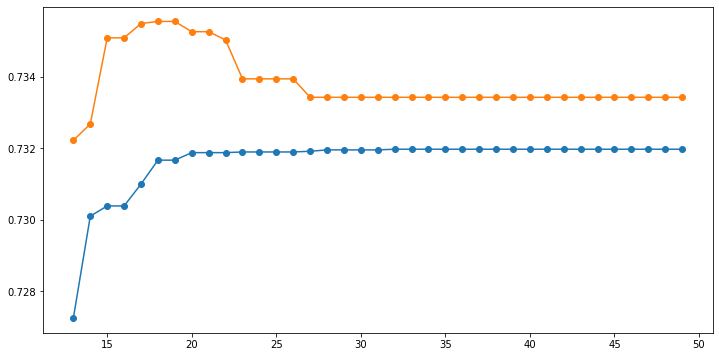

In [28]:
plt.figure(figsize=(12,6))
plt.plot(frame['max_leaf_nodes'], frame['train_accuracy_gini'], marker='o')
plt.plot(frame['max_leaf_nodes'], frame['validation_accuracy_gini'], marker='o')
plt.show()

From this, we can find out that for DT(Gini), it is ideal to have maximum leaf nodes at 18.

In [29]:
dt_model_gini = DecisionTreeClassifier(criterion = 'gini', max_depth=5, max_leaf_nodes=18, random_state=10)

In [30]:
dt_model_gini.fit(X_train, Y_train)

DecisionTreeClassifier(max_depth=5, max_leaf_nodes=18, random_state=10)

In [31]:
#Improved test score for Gini
print('The score for test set is %.3f' % (dt_model_gini.score(X_test, Y_test)*100) +'%')
      

The score for test set is 73.554%


### Determine four most influential attributes on target attribute

Feature: age_y , Score: 0.11945
Feature: gender , Score: 0.00000
Feature: bmi , Score: 0.00455
Feature: ap_hi , Score: 0.78649
Feature: ap_lo , Score: 0.00386
Feature: cholesterol , Score: 0.07951
Feature: gluc , Score: 0.00380
Feature: smoke_or_alco , Score: 0.00000
Feature: active , Score: 0.00233


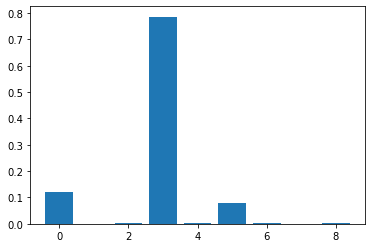

In [32]:
importance = dt_model_gini.feature_importances_

# summarize feature importance
for i,v in enumerate(importance):
    print('Feature: '+ features[i]+' , Score: %.5f' % (v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

The four most influential attributes are ap_hi, age_y, cholesterol and bmi

###  Calculate and print the confusion matrix, and the classification Report 

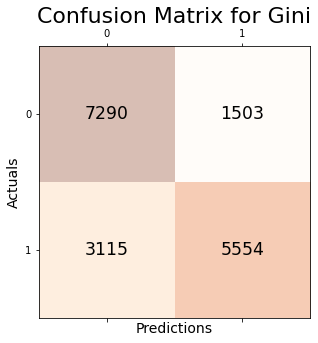

In [33]:
y_pred_gini = dt_model_gini.predict(X_test)

conf_matrix = confusion_matrix(y_true=Y_test, y_pred=y_pred_gini)
#
# Print the confusion matrix using Matplotlib
#
fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(conf_matrix, cmap=plt.cm.Oranges, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=14)
plt.ylabel('Actuals', fontsize=14)
plt.title('Confusion Matrix for Gini', fontsize=22)
plt.show()

In [34]:
 #Printing the report and confusion matrix for gini
    
from sklearn.metrics import classification_report
print(classification_report(Y_test, y_pred_gini))  

              precision    recall  f1-score   support

           0       0.70      0.83      0.76      8793
           1       0.79      0.64      0.71      8669

    accuracy                           0.74     17462
   macro avg       0.74      0.73      0.73     17462
weighted avg       0.74      0.74      0.73     17462



### Print the decision tree visualization with depth of 4, 5.  

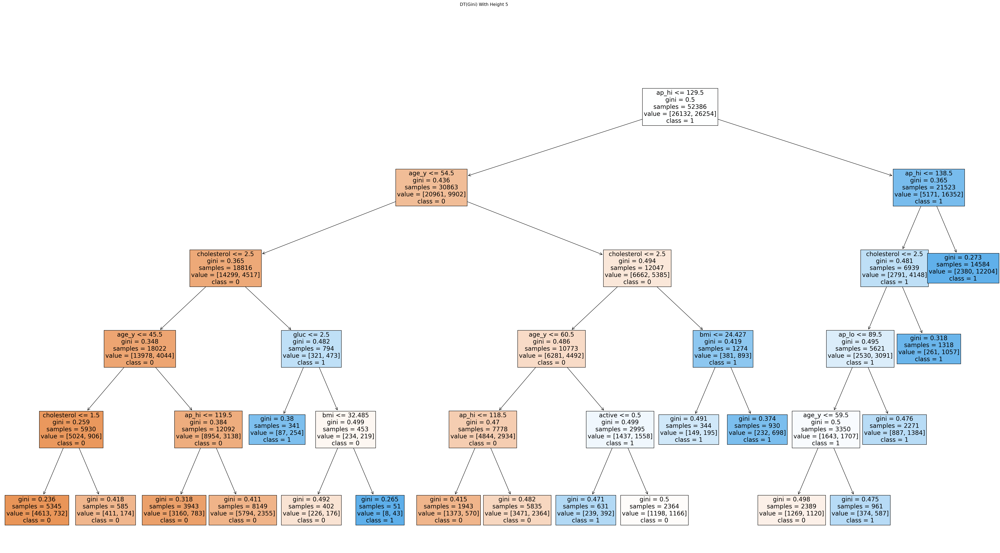

In [35]:
#DT (Gini) with height 5
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (50,25), dpi=200)

tree.plot_tree(dt_model_gini,
           feature_names = features, 
           class_names=["0","1"],
           filled = True, fontsize=17)
plt.suptitle('DT(Gini) With Height 5')
plt.show()

In [36]:
dt_model_gini = DecisionTreeClassifier(criterion = 'gini', max_depth=4, max_leaf_nodes=11, random_state=10)
dt_model_gini.fit(X_train, Y_train)
print('The score for test set is %.3f' % (dt_model_gini.score(X_test, Y_test)*100) +'%')



The score for test set is 73.462%


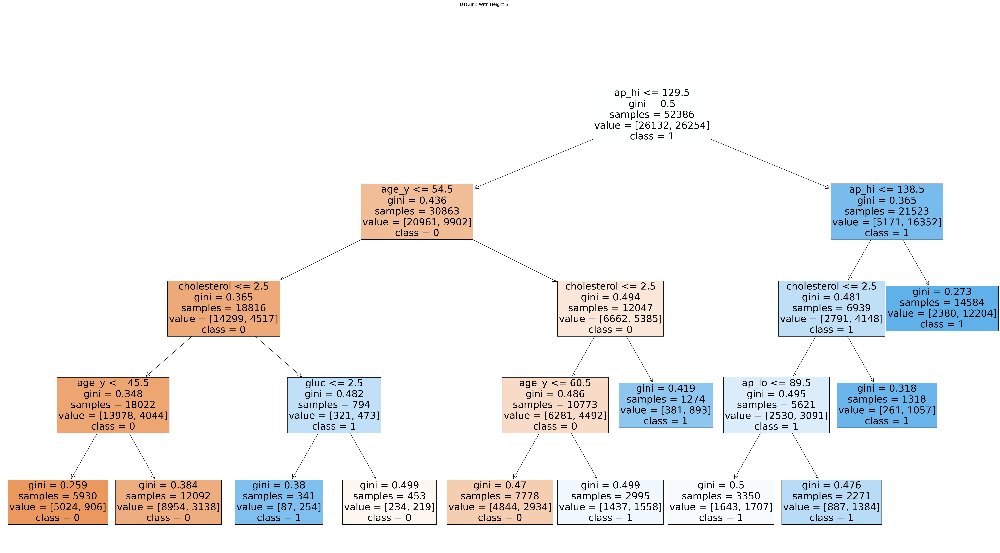

In [37]:
#DT (Gini) with height 4
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (50,25), dpi=200)

tree.plot_tree(dt_model_gini,
           feature_names = features, 
           class_names=["0","1"],
           filled = True, fontsize=27)
plt.suptitle('DT(Gini) With Height 5')
plt.show()

## Tuning our classifiers for Entropy

In [38]:
train_accuracy_entropy = []
validation_accuracy_entropy = []
for max_nodes in range (13,51):
    dt_model = DecisionTreeClassifier(criterion='entropy',max_depth=5, max_leaf_nodes=max_nodes, random_state=10)
    dt_model.fit(X_train, Y_train)
    train_accuracy_entropy.append(dt_model.score(X_train, Y_train))
    validation_accuracy_entropy.append(dt_model.score(X_test, Y_test))

In [39]:
frame= pd.DataFrame({'max_leaf_nodes':range(13,51), 
                     'train_accuracy_entropy':train_accuracy_entropy, 
                     'validation_accuracy_entropy':validation_accuracy_entropy})
frame.head(10)

,max_leaf_nodes,train_accuracy_entropy,validation_accuracy_entropy
0,13,0.727542,0.734624
1,14,0.727542,0.734624
2,15,0.730386,0.735082
3,16,0.730386,0.735082
4,17,0.730386,0.735082
5,18,0.730997,0.735483
6,19,0.731665,0.735540
7,20,0.731665,0.735540
8,21,0.731875,0.735254
9,22,0.731875,0.735254


From this, we can find out that for DT(Gini), it is ideal to have maximum leaf nodes at 21.

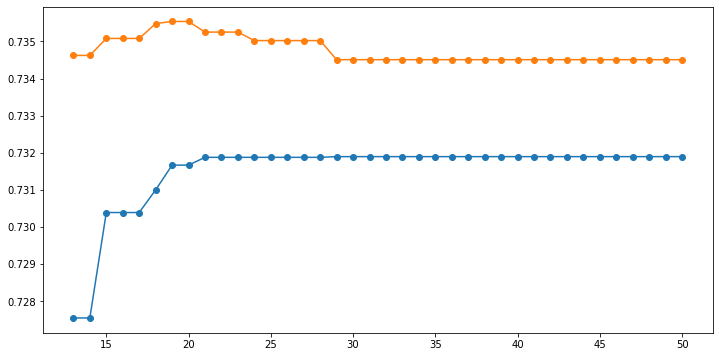

In [40]:
plt.figure(figsize=(12,6))
plt.plot(frame['max_leaf_nodes'], frame['train_accuracy_entropy'], marker='o')
plt.plot(frame['max_leaf_nodes'], frame['validation_accuracy_entropy'], marker='o')
plt.show()

In [41]:
dt_model_entropy = DecisionTreeClassifier(criterion='entropy', max_depth=5, max_leaf_nodes=19, random_state=10)

In [42]:
dt_model_entropy.fit(X_train, Y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=5, max_leaf_nodes=19,
                       random_state=10)

In [43]:
print('The score for test set is %.3f' % (dt_model_entropy.score(X_test, Y_test)*100) +'%')

The score for test set is 73.554%


### Determine four most influential attributes on target attribute

Feature: age_y , Score: 0.11860
Feature: gender , Score: 0.00000
Feature: bmi , Score: 0.00000
Feature: ap_hi , Score: 0.79587
Feature: ap_lo , Score: 0.00396
Feature: cholesterol , Score: 0.07766
Feature: gluc , Score: 0.00390
Feature: smoke_or_alco , Score: 0.00000
Feature: active , Score: 0.00000


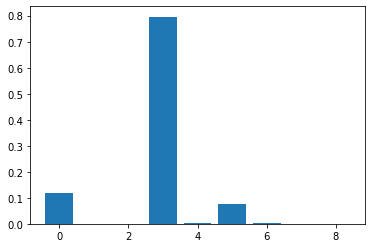

In [44]:
importance = dt_model_gini.feature_importances_

# summarize feature importance
for i,v in enumerate(importance):
    print('Feature: '+ features[i]+' , Score: %.5f' % (v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

The four most influential attributes are ap_hi, age_y, cholesterol and bmi

###  Calculate and print the confusion matrix, and the classification Report 

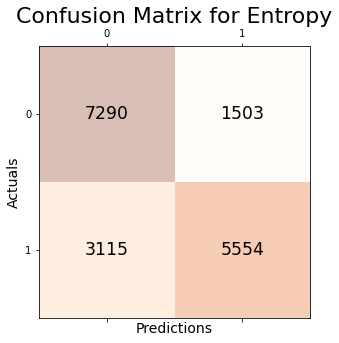

In [45]:
y_pred_entropy = dt_model_entropy.predict(X_test)

conf_matrix = confusion_matrix(y_true=Y_test, y_pred=y_pred_entropy)
#
# Print the confusion matrix using Matplotlib
#
fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(conf_matrix, cmap=plt.cm.Oranges, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=14)
plt.ylabel('Actuals', fontsize=14)
plt.title('Confusion Matrix for Entropy', fontsize=22)
plt.show()

In [46]:
#Printing the report and confusion matrix for gini
    
from sklearn.metrics import classification_report
print(classification_report(Y_test, y_pred_entropy))  

              precision    recall  f1-score   support

           0       0.70      0.83      0.76      8793
           1       0.79      0.64      0.71      8669

    accuracy                           0.74     17462
   macro avg       0.74      0.73      0.73     17462
weighted avg       0.74      0.74      0.73     17462



### Print the decision tree visualization with depth of 4, 5.  

In [47]:
#DT(Entropy) with height 5
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (55,25), dpi=300)

tree.plot_tree(dt_model_entropy,
           feature_names = features,
           class_names=["0","1"],
           filled = True, fontsize=16)
plt.suptitle('DT(Entropy) With Height 5')
plt.show()

In [48]:
dt_model_entropy = DecisionTreeClassifier(criterion='entropy', max_depth=4, max_leaf_nodes=19, random_state=10)
dt_model_entropy.fit(X_train, Y_train)

#DT(Entropy) with height 4
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (55,25), dpi=300)

tree.plot_tree(dt_model_entropy,
           feature_names = features,
           class_names=["0","1"],
           filled = True, fontsize=16)
plt.suptitle('DT(Entropy) With Height 5')
plt.show()

# Naive Bayes Classifier

In [49]:
# Import and create the Naive Bayes Classifier object
from sklearn.naive_bayes import GaussianNB

NB_classifier = GaussianNB()

In [50]:
NB_classifier.fit(X_train,Y_train)

GaussianNB()

In [51]:
# Applying the trained classifer on the test set to obtain and save the predictions
NB_predict = NB_classifier.predict(X_test)

In [52]:
# Calculate the accuracy score by comparing predictions and the 
# actual results of test set
print("Naive Bayes Accuracy Score is ",accuracy_score(NB_predict, Y_test)*100)

Naive Bayes Accuracy Score is  71.26904134692475


### Calculate and print the confusion matrix and the classification Report 

Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.82      0.74      8793
           1       0.77      0.60      0.67      8669

    accuracy                           0.71     17462
   macro avg       0.72      0.71      0.71     17462
weighted avg       0.72      0.71      0.71     17462

Confusion Matrix:



(2.5, -0.5)

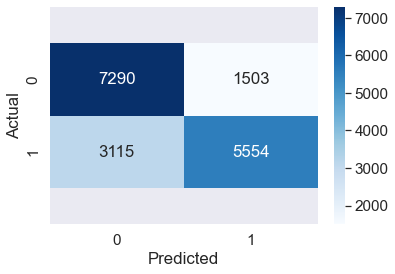

In [53]:
cf_matrix = confusion_matrix(Y_test,NB_predict)


print(f'Classification Report:\n{classification_report(Y_test,NB_predict)}')

df_cm = pd.DataFrame(conf_matrix, columns=np.unique(Y_test), index = np.unique(Y_test))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'

print("Confusion Matrix:\n")
sns.set(font_scale=1.4)#for label size
ax=sns.heatmap(df_cm, cmap="Blues", annot=True,fmt='d')# font size
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

# REPORT

##  Describe the Decision Tree methods, and Naive Bayes classifier.

Decision Tree:

•	Decision tree algorithms are supervised learning algorithms which are used for solving regression and classification problems.

•	The goal of using a Decision Tree is to create a training model that can use to predict the class or value of the target variable by learning simple decision rules inferred from prior data(training data).

•	Sklearn.tree.DecisionTreeClassifier is the method defined by sklearn which allows you to classify data with high degree of accuracy.

•	Some of the parameter passed for this method are criterion which chooses between “gini” or “entropy”, max_depth is the maximum depth of the tree, max_leaf_nodes sets the number of samples required to be at leaf node. There’s also a random_state parameter to input the seed for random number generator.

Naive Bayes:

•	Naive Bayes algorithm is a supervised learning algorithm, which is used for solving classification problems. This algorithm predicts on the basis of probability of an object.

•	Here, we used the Gaussian Naïve Bayes method for classification. The likelihood of the features is assumed to be Gaussian.

•	GaussianNB() is the method used to define the model.  The Gaussian model assumes that features follow a normal distribution.

## Describe the datasets like what do you understand from the dataset? and remember to write down your observation for pre-processing.

•	This dataset consists of heart-related medical data collected during the medical examination of a human being.

•	Some of the attributes in the dataset are age, weight, gender, cholesterol, smoke, alcohol intake etc.

•	This dataset can be used to build a classifier to predict the occurrence of cardiovascular disease.

##  Visualization of the decision tree for gini and entropy.

In [54]:
#Entropy
#DT(Entropy) with height 5
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (55,25), dpi=300)

tree.plot_tree(dt_model_entropy,
           feature_names = features,
           class_names=["0","1"],
           filled = True, fontsize=16)
plt.suptitle('DT(Entropy) With Height 5')
plt.show()

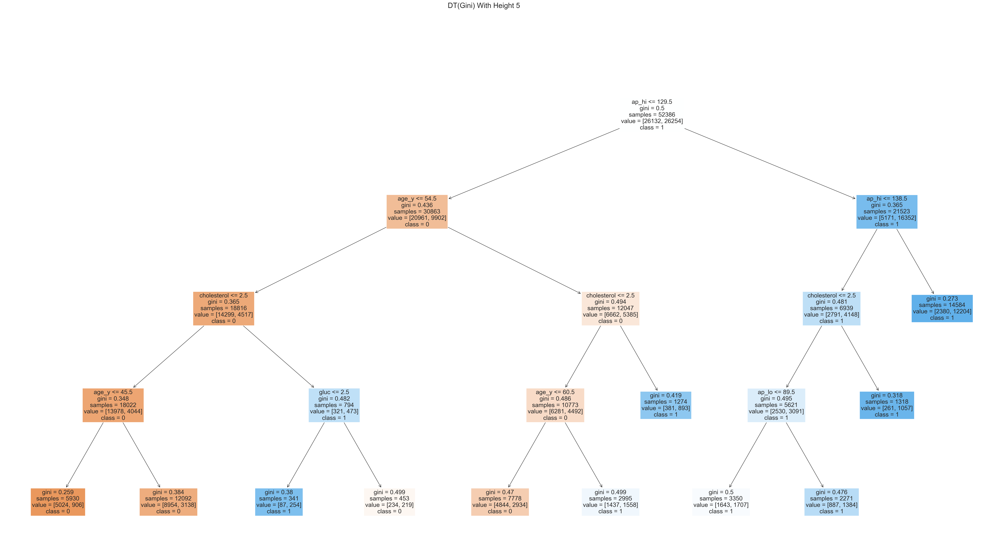

In [55]:
#Gini
#DT (Gini) with height 5
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (50,25), dpi=200)

tree.plot_tree(dt_model_gini,
           feature_names = features, 
           class_names=["0","1"],
           filled = True, fontsize=17)
plt.suptitle('DT(Gini) With Height 5')
plt.show()

## Interpret your results, compare Decision Tree gini and entropy.

In [56]:
print('The score for test set is %.3f' % (dt_model_entropy.score(X_test, Y_test)*100) +'%')

The score for test set is 73.462%


In [57]:
print('The score for test set is %.3f' % (dt_model_gini.score(X_test, Y_test)*100) +'%')

The score for test set is 73.462%


The gini score is 73.462% and the entropy score is 73.462%. Thus we conclude that gini and entropy has the same accuracy score.

## Compare the results of DT(gini), DT(entropy) and Naive Bayes.

In [58]:
print("Naive Bayes Accuracy Score is ",accuracy_score(NB_predict, Y_test)*100)

Naive Bayes Accuracy Score is  71.26904134692475


For the decision tree, the gini score is 73.439% and the entropy score is 73.439%. On the other hand the accuracy for Naïve Bayes(Gaussian) is 71.269%.

The assumption that all features are independent is not usually the case in real life so it makes naive bayes algorithm less accurate than complicated algorithms.

In decision tree you are using a part of training data for testing. At the time of training, decision tree gains the knowledge about the data, and now if you give same data to predict it will give exactly same value. This is why the accuracy is higher.


## Visualize the dataset, for the target variable - 2 graphs 

<AxesSubplot:xlabel='gender', ylabel='bmi'>

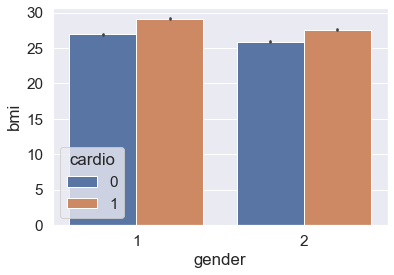

In [60]:
sns.barplot(data=df, x=df['gender'], y=df['bmi'], hue=df['cardio'])

#### from the above visualization of gender 1 and gender 2 we can conclude that on average if the bmi is less there is less chance of having a cardiovascular disease whereas if the bmi is more then there are high chances of having a cardiovascular disease

<AxesSubplot:xlabel='weight', ylabel='ap_hi'>

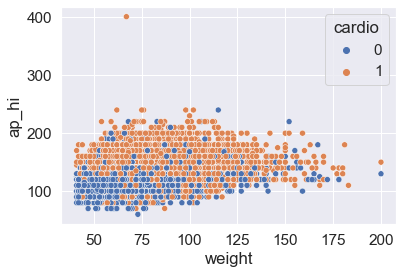

In [63]:
sns.scatterplot(data=df,x=df["weight"], y=df['ap_hi'], hue=df["cardio"])

#### we can consider few cases for the above visualization:
1) people who are extremely obese have great chances of having a cardiovascular disease.

2) people who are not obese and high bp also have have great chances of having a cardiovascular disease.

3) people who are not obese and have a comparatively lower values of ap_hi have very less chances of having a cardiovascular disease.

References:
1.	https://www.bogotobogo.com/python/scikit-learn/scikt_machine_learning_Decision_Tree_Learning_Informatioin_Gain_IG_Impurity_Entropy_Gini_Classification_Error.php
2.	https://scikit-learn.org/stable/modules/naive_bayes.html
3.	https://www.kdnuggets.com/2019/11/data-cleaning-preprocessing-beginners.html
4. https://vitalflux.com/accuracy-precision-recall-f1-score-python-example/
5. https://scikit-learn.org/stable/modules/generated/sklearn.tree.plot_tree.html
6.https://vitalflux.com/python-draw-confusion-matrix-matplotlib/